# Project Proposal - TDI Challenge - Investigations into Virality

In this notebook, we will be exploring the features of Audio, specifically looking at popular vs. not-so-popular podcasts.

The list of popular podcasts comes from the following website:
http://analytics.podtrac.com/industry-rankings/

Let us first import the necessary packages:


In [134]:
%matplotlib inline
import librosa
import random as rd
import glob 
import os
import copy
import librosa.display
import IPython.display
from mutagen.mp3 import MP3
import numpy as np
import matplotlib.pyplot as plt

What we want to do is take 1 min samples of the audio files and run analysis to find the:

-percentage of the sample that is silence <br>
-tempo of the sample<br>
-mean and std. of spectral flatness (i.e. how tone-like or noise-like the sample was with 0: pure sinusoid, 1: white noise)<br>
-mean and std. of spectral roll-off, or the frequency below which x% of the frequencies lie<br>

First thing, is to take a number of random 1-min samples from the audio file and then calculate the various features above.
We will use a random sample of 20 in this case


In [91]:
# Load the audio files

ser_path_list = []
stuf_path_list = []

for name in glob.glob('Serial/*.mp3'):
    ser_path_list.append(name)

for name in glob.glob('Stuff You Should Know/*.mp3'):
    stuf_path_list.append(name)

In [15]:
def silence_percent(y):
    # Calculate the percentage of the sample that is silence
    rmse = librosa.feature.rmse(y=y)[0]
    times = librosa.frames_to_time(np.arange(len(rmse)))
    r_normalized = (rmse - 0.016) / np.std(rmse)
    p = np.exp(r_normalized) / (1 + np.exp(r_normalized))
    transition = librosa.sequence.transition_loop(2, [0.5, 0.6])
    full_p = np.vstack([1 - p, p])
    states = librosa.sequence.viterbi_discriminative(full_p, transition)
    times_diff = np.array([times[i+1] - times[i] for i in range(len(times)-1) ])
    return 1-sum(times_diff*states[1:])/sum(times_diff)

In [51]:
def feature_arr_out(filename):
    # This function gives an output arrays of features for a given filename
    
    # Load audio file
    y, sr = librosa.load(filename)
    
    # sr is the sample rate, which gives the number of datapoints per second
    # When loading files with librosa the default is sr = 22050 Hz, which will
    # be used here as well.
    # Therefore the number of datapoints in one minute will be:
    onemin = 60*sr

    # We want to create 20 random samples that are 1 min long:
    num_samp = 20

    # Randomly assign start times and add one minute to find end time:
    st_time = [rd.randint(0,len(y)-onemin) for i in range(num_samp)]
    end_time = [time+onemin for time in st_time]
    time_tup= [x for x in zip(st_time,end_time)]

    # Create a numpy array of these one minute samples of the audio
    samp_arr = np.array([y[x[0]:x[1]] for x in time_tup])
    
    # Calculate the percentage of the samples that is silence:
    sil_arr = np.array([silence_percent(samp) for samp in samp_arr])
    
    # Tempo of the samples
    tempo_arr = np.array([librosa.beat.beat_track(y=samp, sr=sr)[0] for samp in samp_arr])
    
    # Spectral flatness
    flat_arr = np.array([librosa.feature.spectral_flatness(samp) for samp in samp_arr])
    
    # And the spectral roll off. We will choose x = 90% for the spectral roll-off values:
    roll_arr = np.array([librosa.feature.spectral_rolloff(y=samp, sr=sr, roll_percent=0.90) for samp in samp_arr])
    
    return sil_arr,tempo_arr,flat_arr,roll_arr

Now we can run through the list of paths to the 'Serial' and 'Stuff You Should Know' episodes and store the feature arrays:

In [ ]:
ser_feat_list = [feature_arr_out(path) for path in ser_path_list]

In [93]:
stuf_feat_list = [feature_arr_out(path) for path in stuf_path_list]   

In [95]:
ser_sil = [ser_feat_list[i][0] for i in range(len(ser_feat_list))]
ser_tempo = [ser_feat_list[i][1] for i in range(len(ser_feat_list))]
ser_flat = [ser_feat_list[i][2] for i in range(len(ser_feat_list))]
ser_roll = [ser_feat_list[i][3] for i in range(len(ser_feat_list))]

In [96]:
stuf_sil = [stuf_feat_list[i][0] for i in range(len(stuf_feat_list))]
stuf_tempo = [stuf_feat_list[i][1] for i in range(len(stuf_feat_list))]
stuf_flat = [stuf_feat_list[i][2] for i in range(len(stuf_feat_list))]
stuf_roll = [stuf_feat_list[i][3] for i in range(len(stuf_feat_list))]

Let's plot the results for the first feature:

## Silence

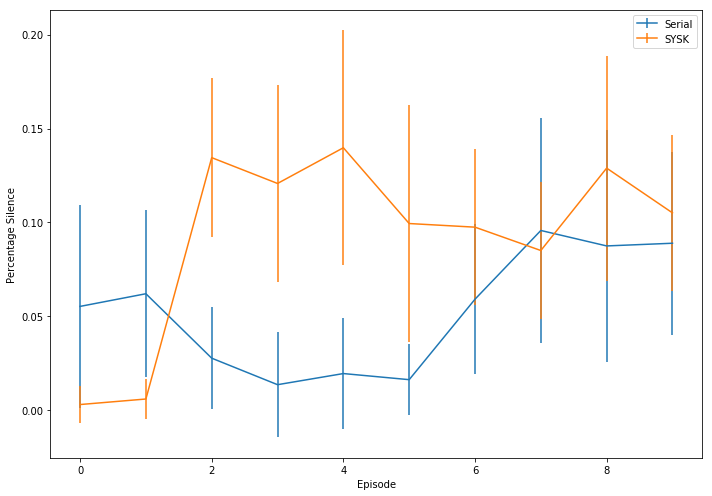

In [120]:
plt.figure(figsize=(10, 7))
plt.errorbar([x for x in range(10)], [x.mean() for x in ser_sil], yerr=[x.std() for x in ser_sil],label='Serial')
plt.errorbar([x for x in range(10)], [x.mean() for x in stuf_sil], yerr=[x.std() for x in stuf_sil],label='SYSK')
plt.xlabel('Episode')
plt.ylabel('Percentage Silence')
plt.legend()
plt.tight_layout()

The episodes are not arranged in any specific order, especially not the 'Stuff You Should Know' (SYSK), as seen below: 


In [121]:
ser_path_list

['Serial\\01 S01 Episode 01_ The Alibi 1.mp3',
 'Serial\\02 S01 Episode 02_ The Breakup.mp3',
 'Serial\\03 S01 Episode 03_ Leakin Park.mp3',
 'Serial\\04 S01 Episode 04_ Inconsistencies.mp3',
 'Serial\\05 S01 Episode 05_ Route Talk.mp3',
 'Serial\\06 S01 Episode 06_ The Case Against.mp3',
 'Serial\\07 S01 Episode 07_ The Opposite of t.mp3',
 'Serial\\08 S01 Episode 08_ The Deal with Jay.mp3',
 'Serial\\09 S01 Episode 09_ To Be Suspected.mp3',
 'Serial\\10 S01 Episode 10_ The Best Defense.mp3']

In [122]:
stuf_path_list

['Stuff You Should Know\\Are Artificial Sweeteners Really Bad.mp3',
 'Stuff You Should Know\\How Epilepsy Works.mp3',
 'Stuff You Should Know\\How Hang Gliding Works.mp3',
 'Stuff You Should Know\\How Internships Work.mp3',
 'Stuff You Should Know\\How Psychopaths Work.mp3',
 'Stuff You Should Know\\How Removing Public Monuments Work.mp3',
 "Stuff You Should Know\\North Korea_ What's the Deal_.mp3",
 'Stuff You Should Know\\SYSK Selects_ How Silly Putty Works.mp3',
 'Stuff You Should Know\\The Unabomber_ Misguided to say the.mp3',
 'Stuff You Should Know\\What is a Mold-A-Rama_.mp3']

However sorting it we recognise that in general 'Serial' has much less silence than 'Stuff You Should Know' (or 'SYSK'):

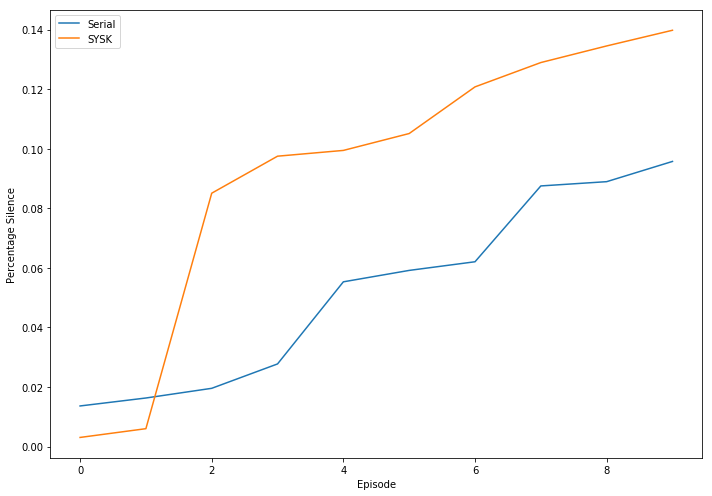

In [126]:
plt.figure(figsize=(10, 7))
plt.plot([x for x in range(10)], sorted([x.mean() for x in ser_sil]), label='Serial')
plt.plot([x for x in range(10)], sorted([x.mean() for x in stuf_sil]), label='SYSK')
plt.xlabel('Episode')
plt.ylabel('Percentage Silence')
plt.legend()
plt.tight_layout()

On Apple iTunes, we have a ranking of the popularity of specific episodes in a given podcast. Ordering the 'Serial' and 'SYSK' by their popularity we obtain the following ordering:

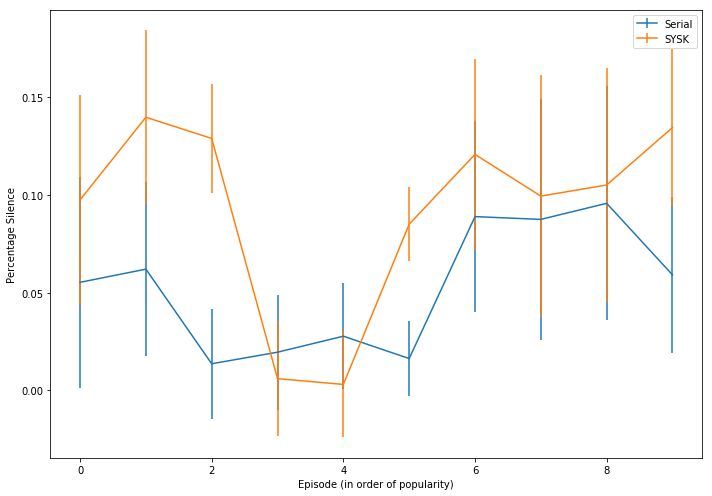

In [147]:
ser_pop_order = [0, 1, 3, 4, 2, 5, 9, 8, 7, 6]
stuf_pop_order = [6, 4, 8, 1, 0, 7, 3, 5, 9, 2]

def pop_mean_std(arr,order):
    org_mean = [x.mean() for x in arr]
    org_std = [x.std() for x in arr]
    pop_mean = [org_mean[i] for i in order]
    pop_std = [org_std[i] for i in order]
    return pop_mean, pop_std

ser_pop_sil, ser_pop_sil_err = (pop_mean_std(ser_sil, ser_pop_order))
stuf_pop_sil, stuf_pop_sil_err = (pop_mean_std(stuf_sil, stuf_pop_order))


plt.figure(figsize=(10, 7))
plt.errorbar([x for x in range(10)], ser_pop_sil, yerr=ser_pop_sil_err,label='Serial')
plt.errorbar([x for x in range(10)], stuf_pop_sil, yerr=ser_pop_sil_err,label='SYSK')
plt.xlabel('Episode (in order of popularity)')
plt.ylabel('Percentage Silence')
plt.legend()
plt.tight_layout()

We can see that for 'Serial', longer silences are generally associated with less popularity, but the correlation is not too strong. For 'SYSK' Very popular episodes are high in silence time, just as low popularity episodes. There may be some effect occuring due to the popularity of the subject matter, or interest in the topic at time. Analysis over more episodes and more podcasts would need to do be done to see if there is an effect here.

Let's now look at the other features:

## Tempo

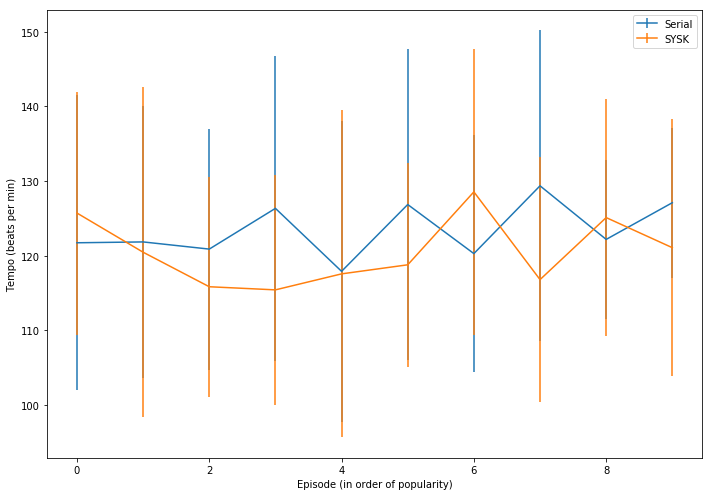

In [148]:
ser_pop_tempo, ser_pop_tempo_err = (pop_mean_std(ser_tempo, ser_pop_order))
stuf_pop_tempo, stuf_pop_tempo_err = (pop_mean_std(stuf_tempo, stuf_pop_order))

plt.figure(figsize=(10, 7))
plt.errorbar([x for x in range(10)], ser_pop_tempo, yerr=ser_pop_tempo_err,label='Serial')
plt.errorbar([x for x in range(10)], stuf_pop_tempo, yerr=stuf_pop_tempo_err,label='SYSK')
plt.xlabel('Episode (in order of popularity)')
plt.ylabel('Tempo (beats per min)')
plt.legend()
plt.tight_layout()

Both 'Serial' and 'SYSK' have a tempo of about 120 bpm, with large standard deviations from 100-140. Also there seems to be no relationship between the tempo of the music and the popularity, but this is due to no significant variation between episodes to begin with.


## Spectral Flatness

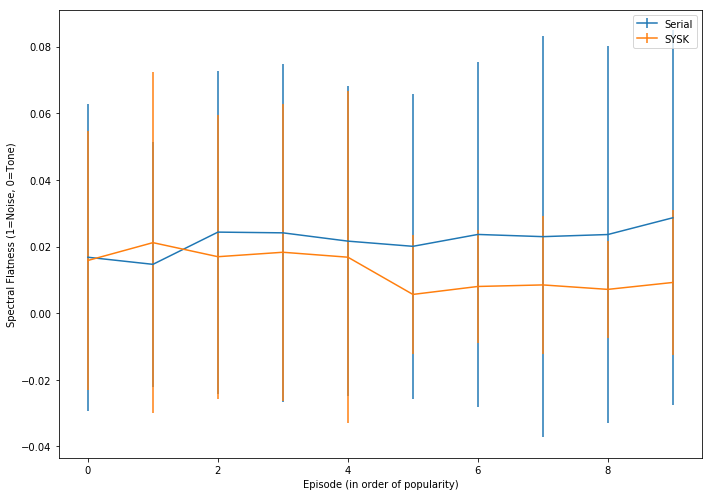

In [143]:
ser_pop_flat, ser_pop_flat_err = (pop_mean_std(ser_flat, ser_pop_order))
stuf_pop_flat, stuf_pop_flat_err = (pop_mean_std(stuf_flat, stuf_pop_order))

plt.figure(figsize=(10, 7))
plt.errorbar([x for x in range(10)], ser_pop_flat, yerr=ser_pop_flat_err,label='Serial')
plt.errorbar([x for x in range(10)], stuf_pop_flat, yerr=stuf_pop_flat_err,label='SYSK')
plt.xlabel('Episode (in order of popularity)')
plt.ylabel('Spectral Flatness (1=Noise, 0=Tone)')
plt.legend()
plt.tight_layout()

'SYSK' have a pretty consistent Spectral Flatness around 0.02 and the variation is quite high as well. 'Serial' has lower variance for less popular episodes

## Spectral Roll-Off

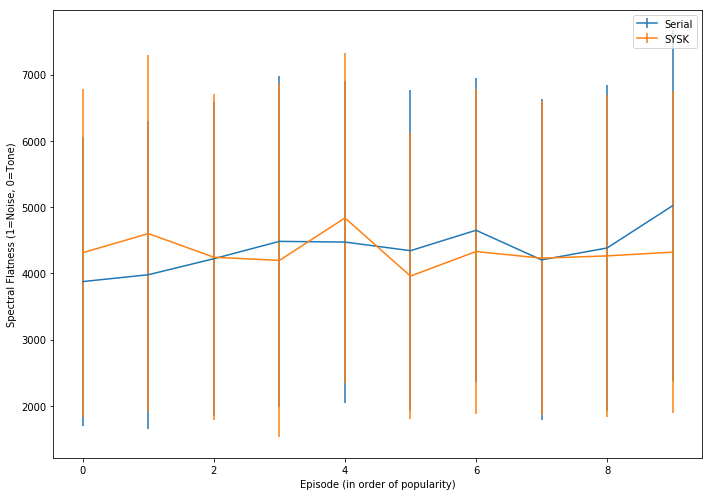

In [145]:
ser_pop_roll, ser_pop_roll_err = (pop_mean_std(ser_roll, ser_pop_order))
stuf_pop_roll, stuf_pop_roll_err = (pop_mean_std(stuf_roll, stuf_pop_order))

plt.figure(figsize=(10, 7))
plt.errorbar([x for x in range(10)], ser_pop_roll, yerr=ser_pop_roll_err,label='Serial')
plt.errorbar([x for x in range(10)], stuf_pop_roll, yerr=stuf_pop_roll_err,label='SYSK')
plt.xlabel('Episode (in order of popularity)')
plt.ylabel('Spectral Flatness (1=Noise, 0=Tone)')
plt.legend()
plt.tight_layout()

Spectral roll-off has no clear effect on the popularity of the episode either.

Therefore in all cases apart from silence, the lack of variation between episodes means that these features are not useful to determine anything about the popularity of the episode in question. Further investigation is necessary for silence.

We can run through a number of the basic operations and features of the librosa package below:

In [7]:
# Loading a file
y, sr = librosa.load("Serial/01 S01 Episode 01_ The Alibi 1.mp3")

In [28]:
# Printing the length(or number of datapoints) and sample rate (datapoints per second)
print(len(y), sr)

70991160 22050


In [77]:
# Calculate number of datapoints in one minute:
onemin = 22050*60

In [78]:
# Random start point and one minute after it:
strt = 5000000
fin1 = strt + onemin

Play the audio file from start point to end point:

In [53]:
IPython.display.Audio(data=y[strt:fin1], rate=sr)

In [97]:
# We can choose a different start and therefore end point:
IPython.display.Audio(data=y[strt-1000000:fin1-1000000], rate=sr)

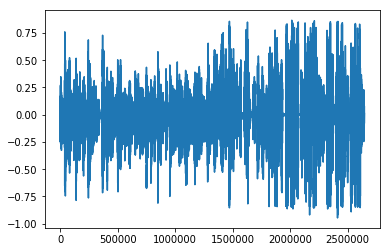

In [37]:
plt.figure()
plt.plot(y[2000000:4646000])

In [56]:
tempo, beats = librosa.beat.beat_track(y=y[strt:fin1], sr=sr)

C:\Users\Ronald Maj\AppData\Local\conda\conda\envs\TDI-Challenge\lib\site-packages\scipy\fftpack\basic.py:160: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  z[index] = x


In [59]:
clicks = librosa.clicks(frames=beats, sr=sr, length=len(y[strt:fin1]))

IPython.display.Audio(data=y[strt:fin1] + clicks, rate=sr)

In [60]:
tempo

112.34714673913044

In [65]:
np.array([beats[i+1]-beats[i] for i in range(len(beats)-1)]).mean()

23.1588785046729

In [66]:
np.array([beats[i+1]-beats[i] for i in range(len(beats)-1)]).std()

1.415201400483505

In [67]:
chroma = librosa.feature.chroma_cqt(y=y[strt:fin1], sr=sr)
chroma_sync = librosa.util.sync(chroma, beats)

Text(0,0.5,'Beat sync')

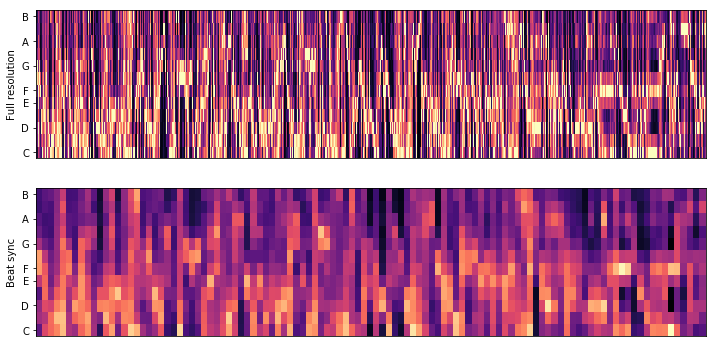

In [68]:
plt.figure(figsize=(12, 6))
plt.subplot(2, 1, 1)
librosa.display.specshow(chroma, y_axis='chroma')
plt.ylabel('Full resolution')
plt.subplot(2, 1, 2)
librosa.display.specshow(chroma_sync, y_axis='chroma')
plt.ylabel('Beat sync')

In [73]:
D = librosa.stft(y[strt:fin1])

In [74]:
D_harm, D_perc = librosa.decompose.hpss(D)

y_harm = librosa.istft(D_harm)

y_perc = librosa.istft(D_perc)

In [76]:
IPython.display.Audio(data=y_harm, rate=sr)


In [76]:
IPython.display.Audio(data=y_perc, rate=sr)

NameError: name 'y_perc' is not defined

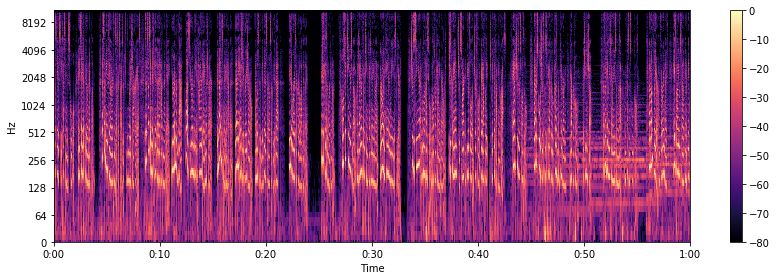

In [83]:
# And compute the spectrogram magnitude and phase
S_full, phase = librosa.magphase(librosa.stft(y[strt:fin1]))


###################
# Plot the spectrum
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.colorbar()
plt.tight_layout()

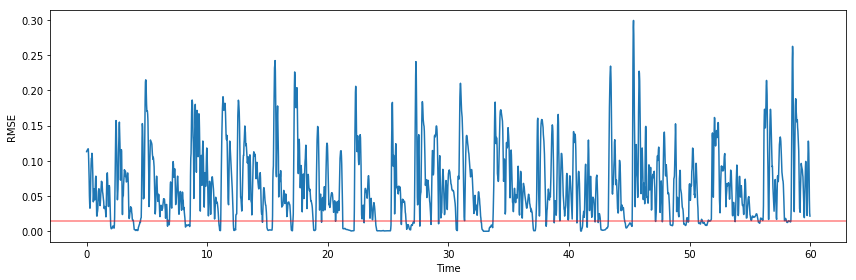

In [85]:
# As a first step, we can plot the root-mean-square energy (RMSE)
rmse = librosa.feature.rmse(y=y[strt:fin1])[0]

times = librosa.frames_to_time(np.arange(len(rmse)))

plt.figure(figsize=(12, 4))
plt.plot(times, rmse)
plt.axhline(0.015, color='r', alpha=0.5)
plt.xlabel('Time')
plt.ylabel('RMSE')
plt.axis('tight')
plt.tight_layout()

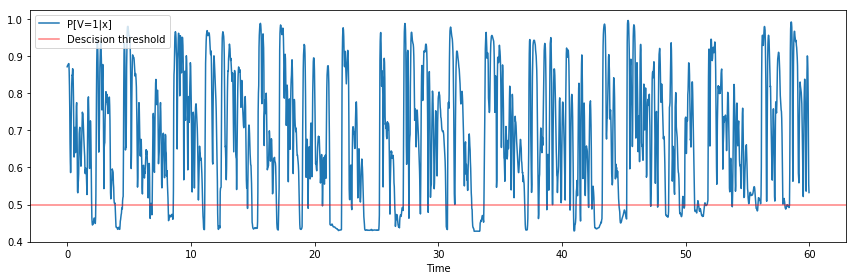

In [86]:
r_normalized = (rmse - 0.015) / np.std(rmse)
p = np.exp(r_normalized) / (1 + np.exp(r_normalized))

# We can plot the probability curve over time:

plt.figure(figsize=(12, 4))
plt.plot(times, p, label='P[V=1|x]')
plt.axhline(0.5, color='r', alpha=0.5, label='Descision threshold')
plt.xlabel('Time')
plt.axis('tight')
plt.legend()
plt.tight_layout()

In [87]:
transition = librosa.sequence.transition_loop(2, [0.5, 0.6])

In [88]:
full_p = np.vstack([1 - p, p])

In [89]:
states = librosa.sequence.viterbi_discriminative(full_p, transition)

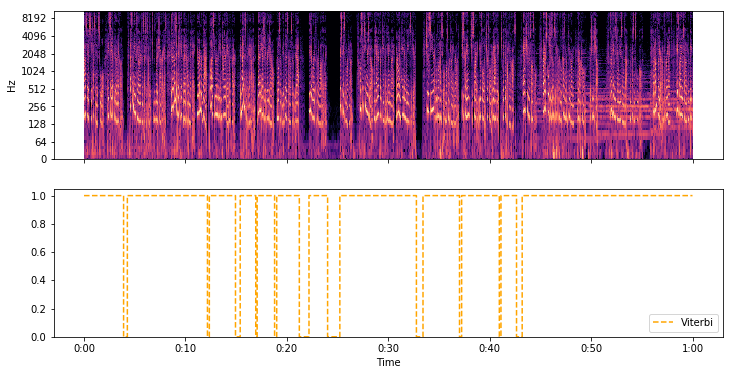

In [91]:
# sphinx_gallery_thumbnail_number = 5
plt.figure(figsize=(12, 6))
ax = plt.subplot(2,1,1)
librosa.display.specshow(librosa.amplitude_to_db(S_full, ref=np.max),
                         y_axis='log', x_axis='time', sr=sr)
plt.xlabel('')
ax.tick_params(labelbottom=False)
plt.subplot(2, 1, 2, sharex=ax)
#plt.step(times, p>=0.5, label='Frame-wise')
plt.step(times, states, linestyle='--', color='orange', label='Viterbi')
plt.xlabel('Time')
plt.axis('tight')
plt.ylim([0, 1.05])
plt.legend()

In [98]:
times_diff = np.array([times[i+1] - times[i] for i in range(len(times)-1) ])
times[2]

0.046439909297052155

In [105]:
sum(times_diff*states[1:])/sum(times_diff)

0.9148277197057686